In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import os # accessing directory structure
import folium
import geopy
import requests # library to handle requests
import json

%matplotlib inline

In [11]:
df = pd.read_csv('COVID19 _Toronto_cases_Apr2021.csv', delimiter=',')
nRow, nCol = df.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 135575 rows and 18 columns


In [12]:
df.head()

,_id,Assigned_ID,Outbreak Associated,Age Group,Neighbourhood Name,FSA,Source of Infection,Classification,Episode Date,Reported Date,Client Gender,Outcome,Currently Hospitalized,Currently in ICU,Currently Intubated,Ever Hospitalized,Ever in ICU,Ever Intubated
0,1128928,1,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-22,2020-01-23,FEMALE,RESOLVED,No,No,No,No,No,No
1,1128929,2,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-21,2020-01-23,MALE,RESOLVED,No,No,No,Yes,No,No
2,1128930,3,Sporadic,20 to 29 Years,Parkwoods-Donalda,M3A,Travel,CONFIRMED,2020-02-05,2020-02-21,FEMALE,RESOLVED,No,No,No,No,No,No
3,1128931,4,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-16,2020-02-25,FEMALE,RESOLVED,No,No,No,No,No,No
4,1128932,5,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-20,2020-02-26,MALE,RESOLVED,No,No,No,No,No,No


In [13]:
df.rename(columns={'FSA':'PostalCode','_id':'id','Neighbourhood Name':'Neighbourhood','Age Group':'Age','Source of Infection':'Source','Episode Date':'Date','Client Gender':'Gender','Outbreak Associated':'Type'},inplace=True)
df.drop(['id','PostalCode','Currently Hospitalized','Currently in ICU','Currently Intubated','Ever Hospitalized','Ever in ICU','Ever Intubated'],axis=1,inplace=True)


df.head()

,Assigned_ID,Type,Age,Neighbourhood,Source,Classification,Date,Reported Date,Gender,Outcome
0,1,Sporadic,50 to 59 Years,Willowdale East,Travel,CONFIRMED,2020-01-22,2020-01-23,FEMALE,RESOLVED
1,2,Sporadic,50 to 59 Years,Willowdale East,Travel,CONFIRMED,2020-01-21,2020-01-23,MALE,RESOLVED
2,3,Sporadic,20 to 29 Years,Parkwoods-Donalda,Travel,CONFIRMED,2020-02-05,2020-02-21,FEMALE,RESOLVED
3,4,Sporadic,60 to 69 Years,Church-Yonge Corridor,Travel,CONFIRMED,2020-02-16,2020-02-25,FEMALE,RESOLVED
4,5,Sporadic,60 to 69 Years,Church-Yonge Corridor,Travel,CONFIRMED,2020-02-20,2020-02-26,MALE,RESOLVED


In [14]:
df = df[df['Classification']=='CONFIRMED']
df.drop(['Classification'],axis=1,inplace=True)

In [15]:
df.isnull().sum()


Assigned_ID         0
Type                0
Age                25
Neighbourhood    2144
Source              0
Date                0
Reported Date       0
Gender              0
Outcome             0
dtype: int64

In [16]:
df.dropna(inplace=True)
df.isnull().sum()

Assigned_ID      0
Type             0
Age              0
Neighbourhood    0
Source           0
Date             0
Reported Date    0
Gender           0
Outcome          0
dtype: int64

In [17]:
df['Neighbourhood'].unique().shape

(140,)

In [19]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="explorer")

lat_list = []
lng_list = []
neigh_list = []
for neigh in df['Neighbourhood'].unique():
#     if neigh=='Clairlea-Birchmount':
#         neigh='Clairlea'
#     if neigh=='Wexford/Maryvale':
#         neigh='Wexford'
#     if neigh=='Birchcliffe-Cliffside':
#         neigh='Cliffside'        
#     if neigh=='Agincourt South-Malvern West':
#         neigh='Agincourt'        
      
    address = '{},Toronto'.format(neigh)
    location = geolocator.geocode(address)
    try:
        latitude = location.latitude
        longitude = location.longitude
    except:
        api_key = '***************'
        # url variable store url 
        url = 'https://maps.googleapis.com/maps/api/geocode/json?'
        # take place as input 
        place = address
        # get method of requests module 
        # return response object 
        res_ob = requests.get(url + 'address=' +
                        place + '&key=' + api_key) 
        # json method of response object 
        # convert json format data  
        # into python format data. 
        x = res_ob.json() 
        latitude = x['results'][0]['geometry']['location']['lat']
        longitude = x['results'][0]['geometry']['location']['lng']

    print(address,'\t\t\t\tLat:',latitude,'\t\tLong:',longitude)
    lat_list += [latitude,]
    lng_list += [longitude,]
    neigh_list += [neigh,]


Willowdale East,Toronto 				Lat: 43.7615095 		Long: -79.4109234
Parkwoods-Donalda,Toronto 				Lat: 43.7527765 		Long: -79.32643999999999
Church-Yonge Corridor,Toronto 				Lat: 43.6707855 		Long: -79.3856867
Newtonbrook West,Toronto 				Lat: 43.795986 		Long: -79.4130896
Milliken,Toronto 				Lat: 43.8231743 		Long: -79.3017626
Willowdale West,Toronto 				Lat: 43.7615095 		Long: -79.4109234
Henry Farm,Toronto 				Lat: 43.7695089 		Long: -79.354296
Don Valley Village,Toronto 				Lat: 43.7926732 		Long: -79.3547219
Bridle Path-Sunnybrook-York Mills,Toronto 				Lat: 43.7359137 		Long: -79.3718986
Annex,Toronto 				Lat: 43.6703377 		Long: -79.407117
Leaside-Bennington,Toronto 				Lat: 43.7014812 		Long: -79.3731559
Moss Park,Toronto 				Lat: 43.6546438 		Long: -79.3697278
St.Andrew-Windfields,Toronto 				Lat: 18.0245439 		Long: -76.8170719
Malvern,Toronto 				Lat: 43.8091955 		Long: -79.2217008
High Park North,Toronto 				Lat: 43.6573833 		Long: -79.470961
Waterfront Communities-The Island,T

In [20]:
df2 = pd.DataFrame({'Latitude':lat_list,'Longitude':lng_list},index=neigh_list)
df2.head()

,Latitude,Longitude
Willowdale East,43.761510,-79.410923
Parkwoods-Donalda,43.752777,-79.326440
Church-Yonge Corridor,43.670786,-79.385687
Newtonbrook West,43.795986,-79.413090
Milliken,43.823174,-79.301763


In [25]:
from geopy.geocoders import Nominatim

address = "Toronto, Canada"

geolocator = Nominatim(user_agent="explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))



# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, neighborhood in zip(df2['Latitude'], df2['Longitude'], df2.index.values):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [26]:
## We use Foursquare API to get information on the Neighbourhoods
import foursquare_keys  # python script that contains my personal CLIENT IDs
CLIENT_ID = foursquare_keys.CLIENT_ID # your Foursquare ID
CLIENT_SECRET = foursquare_keys.CLIENT_SECRET # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

#### Let's create a function to get the nearby Venues to all the neighborhoods in Toronto

#### Note that we are using radius=1000 meter because we need enough distance to get several Venues per neighbourhood. 



In [27]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print("Venues found for",name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [28]:
# Apply the function to the dataframe with latitude and longitude
toronto_venues = getNearbyVenues(names=df2.index.values,
                                   latitudes=df2['Latitude'],
                                   longitudes=df2['Longitude']
                                  )

Venues found for Willowdale East
Venues found for Parkwoods-Donalda
Venues found for Church-Yonge Corridor
Venues found for Newtonbrook West
Venues found for Milliken
Venues found for Willowdale West
Venues found for Henry Farm
Venues found for Don Valley Village
Venues found for Bridle Path-Sunnybrook-York Mills
Venues found for Annex
Venues found for Leaside-Bennington
Venues found for Moss Park
Venues found for St.Andrew-Windfields
Venues found for Malvern
Venues found for High Park North
Venues found for Waterfront Communities-The Island
Venues found for Mimico (includes Humber Bay Shores)
Venues found for Danforth-East York
Venues found for Princess-Rosethorn
Venues found for Long Branch
Venues found for Dovercourt-Wallace Emerson-Junction
Venues found for Mount Pleasant West
Venues found for Mount Pleasant East
Venues found for North Riverdale
Venues found for Eringate-Centennial-West Deane
Venues found for Palmerston-Little Italy
Venues found for Bedford Park-Nortown
Venues foun

In [29]:
# Check the number of total venues
print(toronto_venues.shape)
toronto_venues.head()

(6234, 7)


,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Willowdale East,43.76151,-79.410923,Kinka Izakaya,43.760161,-79.409827,Japanese Restaurant
1,Willowdale East,43.76151,-79.410923,EatBKK,43.759320,-79.410454,Thai Restaurant
2,Willowdale East,43.76151,-79.410923,Sushi Moto Sake & Wine Bar,43.764095,-79.411344,Sushi Restaurant
3,Willowdale East,43.76151,-79.410923,Longo’s Sheppard Centre,43.762221,-79.410762,Grocery Store
4,Willowdale East,43.76151,-79.410923,Pizzaiolo,43.764289,-79.411780,Pizza Place


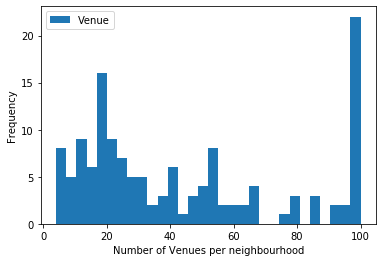

In [30]:
# How many venues in each neighbourhood
number_of_venues = toronto_venues.groupby('Neighbourhood').count()[['Venue']]
number_of_venues.plot(kind='hist',bins=30)
plt.xlabel('Number of Venues per neighbourhood')
plt.show()

In [31]:
number_of_cases = df.groupby('Neighbourhood').count()[['Type']]
number_of_cases.columns = ['Total Cases']
number_of_cases

,Total Cases
Neighbourhood,
Agincourt North,1109
Agincourt South-Malvern West,928
Alderwood,356
Annex,749
Banbury-Don Mills,753
...,...
Wychwood,473
Yonge-Eglinton,229
Yonge-St.Clair,212


In [32]:
# Let's merge the two dataframes to combine the covid19 information and the venues information
cases_and_vanues = number_of_cases.merge(number_of_venues,on='Neighbourhood')

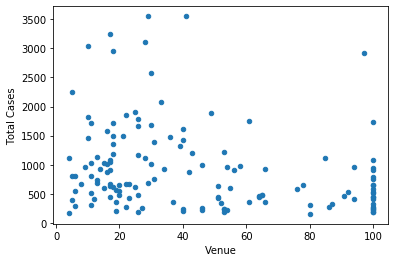

In [33]:
cases_and_vanues.plot(kind='scatter',x='Venue',y='Total Cases')

### This is surprising. Contrary to what I expected, COVID19 cases are more frequent in Neighborhoods with few venues. 

In [34]:
# Let's look more into the different kinds of venues
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 342 uniques categories.


In [35]:
# Let's find the top 30 more common venue types
common_venues = pd.DataFrame({'Counts':pd.Series(toronto_venues['Venue Category'].value_counts())}).sort_values(by='Counts',ascending=False)[:30]
common_venues

,Counts
Coffee Shop,405
Café,261
Park,219
Pizza Place,205
Italian Restaurant,172
Restaurant,168
Bakery,156
Grocery Store,149
Sandwich Place,134
Bank,120


In [36]:
toronto_venues.head(10)

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Willowdale East,43.76151,-79.410923,Kinka Izakaya,43.760161,-79.409827,Japanese Restaurant
1,Willowdale East,43.76151,-79.410923,EatBKK,43.759320,-79.410454,Thai Restaurant
2,Willowdale East,43.76151,-79.410923,Sushi Moto Sake & Wine Bar,43.764095,-79.411344,Sushi Restaurant
3,Willowdale East,43.76151,-79.410923,Longo’s Sheppard Centre,43.762221,-79.410762,Grocery Store
4,Willowdale East,43.76151,-79.410923,Pizzaiolo,43.764289,-79.411780,Pizza Place
5,Willowdale East,43.76151,-79.410923,Bake Code 烘焙密碼,43.763969,-79.411641,Bakery
6,Willowdale East,43.76151,-79.410923,Konjiki Ramen,43.766998,-79.412222,Ramen Restaurant
7,Willowdale East,43.76151,-79.410923,Five Guys,43.762400,-79.410763,Burger Joint
8,Willowdale East,43.76151,-79.410923,MYMY Chicken,43.764658,-79.411096,Fried Chicken Joint
9,Willowdale East,43.76151,-79.410923,Union Social Eatery,43.763797,-79.411358,Restaurant


In [37]:
toronto_venues_top10 = toronto_venues[toronto_venues['Venue Category'].isin(common_venues.index.values)]
toronto_venues_top10

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Willowdale East,43.761510,-79.410923,Kinka Izakaya,43.760161,-79.409827,Japanese Restaurant
1,Willowdale East,43.761510,-79.410923,EatBKK,43.759320,-79.410454,Thai Restaurant
2,Willowdale East,43.761510,-79.410923,Sushi Moto Sake & Wine Bar,43.764095,-79.411344,Sushi Restaurant
3,Willowdale East,43.761510,-79.410923,Longo’s Sheppard Centre,43.762221,-79.410762,Grocery Store
4,Willowdale East,43.761510,-79.410923,Pizzaiolo,43.764289,-79.411780,Pizza Place
...,...,...,...,...,...,...,...
6227,Tam O'Shanter-Sullivan,43.779883,-79.305538,Gusto Pizza,43.783607,-79.298983,Pizza Place
6228,Tam O'Shanter-Sullivan,43.779883,-79.305538,Warden Mart Dollar & Smoke Shop,43.784852,-79.310418,Convenience Store
6229,Tam O'Shanter-Sullivan,43.779883,-79.305538,Warden Ave & Huntingwood Dr,43.786781,-79.308404,Intersection
6230,Tam O'Shanter-Sullivan,43.779883,-79.305538,Scarden park,43.772063,-79.302825,Park


In [38]:
venues_count_top10 = (pd.get_dummies(toronto_venues_top10['Venue Category']))
venues_count_top10['Neighbourhood'] = toronto_venues_top10['Neighbourhood']
venues_count_hot10 = venues_count_top10.groupby('Neighbourhood').sum()
venues_count_hot10['Total Venues'] = venues_count_hot10.sum(axis=1)
cases_venues_hot10 = venues_count_hot10.merge(number_of_cases,on='Neighbourhood')
cases_venues_hot10


,Bakery,Bank,Bar,Breakfast Spot,Burger Joint,Café,Chinese Restaurant,Coffee Shop,Convenience Store,Discount Store,...,Pharmacy,Pizza Place,Pub,Restaurant,Sandwich Place,Sushi Restaurant,Thai Restaurant,Vietnamese Restaurant,Total Venues,Total Cases
Neighbourhood,,,,,,,,,,,,,,,,,,,,,
Agincourt North,1,2,0,0,0,0,1,2,1,1,...,1,1,0,1,1,0,0,1,17,1109
Agincourt South-Malvern West,2,2,1,1,0,0,1,3,0,1,...,1,1,0,6,2,1,0,0,29,928
Alderwood,0,0,0,0,0,0,0,1,2,2,...,1,2,1,0,1,0,0,0,14,356
Annex,3,0,2,0,1,7,0,3,0,0,...,0,1,1,4,2,1,1,1,50,749
Banbury-Don Mills,0,2,0,0,1,0,0,3,0,1,...,1,1,1,2,0,0,0,0,16,753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wychwood,2,2,0,0,1,2,1,3,0,1,...,1,2,0,3,1,2,1,0,39,473
Yonge-Eglinton,2,1,1,1,1,5,0,8,0,0,...,1,3,3,4,1,6,0,1,60,229
Yonge-St.Clair,1,0,0,1,1,2,0,2,0,0,...,0,0,1,2,0,4,1,0,24,212


In [39]:
cases_venues_hot10.corr()['Total Cases'].sort_values()

Café                        -0.320584
Total Venues                -0.303757
Bakery                      -0.299674
Ice Cream Shop              -0.299095
Burger Joint                -0.297114
Sushi Restaurant            -0.294087
Italian Restaurant          -0.289383
Bar                         -0.249326
Thai Restaurant             -0.247097
Pub                         -0.240891
Breakfast Spot              -0.240386
Mexican Restaurant          -0.234243
Restaurant                  -0.185556
Coffee Shop                 -0.170733
Park                        -0.153910
Gym                         -0.141512
Bank                        -0.131907
Greek Restaurant            -0.121183
Japanese Restaurant         -0.119462
Indian Restaurant           -0.118049
Middle Eastern Restaurant   -0.096850
Pizza Place                 -0.094670
Sandwich Place              -0.041162
Convenience Store           -0.037592
Vietnamese Restaurant        0.022161
Grocery Store                0.042482
Discount Sto

Text(0, 0.5, 'Total Cases')

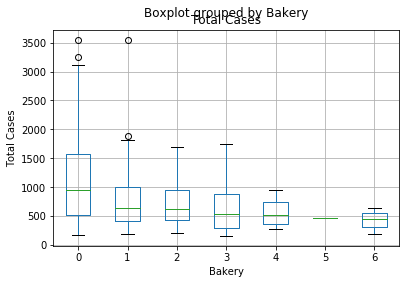

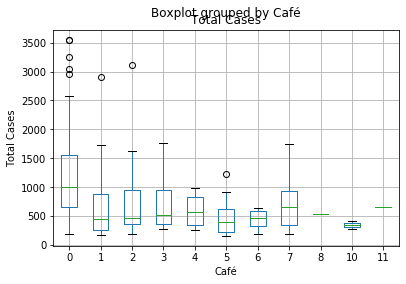

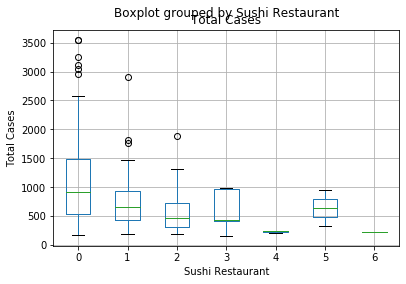

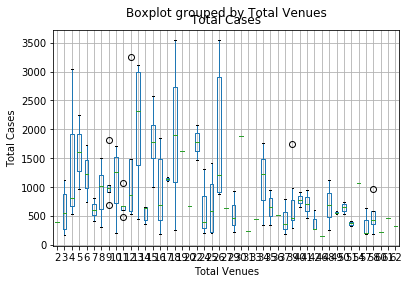

In [40]:
cases_venues_hot10.boxplot(by='Bakery',column='Total Cases')
plt.ylabel("Total Cases")
cases_venues_hot10.boxplot(by='Café',column='Total Cases')
plt.ylabel("Total Cases")
cases_venues_hot10.boxplot(by='Sushi Restaurant',column='Total Cases')
plt.ylabel("Total Cases")
cases_venues_hot10.boxplot(by='Total Venues',column='Total Cases')
plt.ylabel("Total Cases")

## Now let's introduce new data. This will contain demographic information about each neighbourhood:  Population and Income distribution.

In [41]:
df_full = pd.read_csv('neighbourhood-profiles-2016.csv')

In [42]:
# Let's extract the total population data and create a new dataframe.

df_new = df_full.iloc[2,6:]
df_neighnumber = df_full.iloc[0,6:]
df_new

Agincourt North                 29,113
Agincourt South-Malvern West    23,757
Alderwood                       12,054
Annex                           30,526
Banbury-Don Mills               27,695
                                 ...  
Wychwood                        14,349
Yonge-Eglinton                  11,817
Yonge-St.Clair                  12,528
York University Heights         27,593
Yorkdale-Glen Park              14,804
Name: 2, Length: 140, dtype: object

In [43]:
# Fixing neighbourhood names so that they match the name format in our DataFrame
print(df_new.index.values[15])
print(df_new.index.values[29])
print(df_new.index.values[-13])
df_new.index.values[15] = "Briar Hill - Belgravia"
df_new.index.values[29] = "Danforth-East York"
df_new.index.values[-13] = "Weston-Pellam Park"

Briar Hill-Belgravia
Danforth East York
Weston-Pelham Park


In [44]:
# Let's extract the Income distribution data and create a new dataframe.
df_income = df_full.iloc[1055:1071,6:]
df_income_index = df_full.loc[1055:1070,"Characteristic"]
df_income.index = df_income_index.values
df_income

,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
"Under $5,000",150,320,70,905,300,130,"2,545",610,105,175,...,575,105,435,70,60,135,215,240,350,115
"$5,000 to $9,999",105,130,35,485,150,85,740,255,70,100,...,215,80,470,125,60,125,105,125,220,70
"$10,000 to $14,999",165,205,80,660,245,150,745,290,85,145,...,265,155,685,260,110,185,140,190,350,120
"$15,000 to $19,999",450,275,85,785,435,430,720,355,145,260,...,610,305,"1,160",325,200,405,190,220,540,225
"$20,000 to $24,999",340,350,160,680,430,275,620,405,205,255,...,370,405,905,295,175,380,210,255,555,275
"$25,000 to $29,999",565,415,175,625,495,240,610,385,190,245,...,330,430,"1,020",225,145,245,215,250,580,275
"$30,000 to $34,999",450,395,170,630,500,250,570,435,220,275,...,315,380,"1,035",220,140,265,230,280,650,300
"$35,000 to $39,999",510,450,210,675,575,300,570,405,215,265,...,310,450,"1,060",220,140,290,255,310,645,335
"$40,000 to $44,999",455,470,185,645,555,310,535,415,230,295,...,300,455,"1,075",220,165,280,240,330,635,305
"$45,000 to $49,999",475,445,225,665,575,260,565,430,190,280,...,295,390,"1,020",210,140,225,240,315,565,285


### Before using our income distribution, we need to do some math and interpolate a function that contains the cumulative number of habitants for each increasing income bracket. This way we can then use the function to infer the median income (50-percentile) and the income at the first (20-percentile) and fourth (80-percentile) quintile divisions. 

In [45]:
from scipy import interpolate
income_bin_step = np.array([4999,9999,14999,19999,24999,29999,34999,39999,44999,49999,59999,69999,79999,89999,99999,1000000])
for neigh in df_income:
    income_arr = df_income[neigh][:16]
    Ncum_arr = income_arr.str.replace(",","").astype(int).cumsum().values
    tot_pop = Ncum_arr[-1]
    f = interpolate.interp1d(Ncum_arr,income_bin_step)
    median_income = f(tot_pop/2.0)
    firstquintile_income = f(tot_pop/5.0)
    fourquintile_income = f(tot_pop/5.0*4.0)
    df_income.loc["Median Income",neigh] = median_income
    df_income.loc["First Quintile Income",neigh] = firstquintile_income
    df_income.loc["Fourth Quintile Income",neigh] = fourquintile_income    
    
df_income

,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
"Under $5,000",150,320,70,905,300,130,"2,545",610,105,175,...,575,105,435,70,60,135,215,240,350,115
"$5,000 to $9,999",105,130,35,485,150,85,740,255,70,100,...,215,80,470,125,60,125,105,125,220,70
"$10,000 to $14,999",165,205,80,660,245,150,745,290,85,145,...,265,155,685,260,110,185,140,190,350,120
"$15,000 to $19,999",450,275,85,785,435,430,720,355,145,260,...,610,305,"1,160",325,200,405,190,220,540,225
"$20,000 to $24,999",340,350,160,680,430,275,620,405,205,255,...,370,405,905,295,175,380,210,255,555,275
"$25,000 to $29,999",565,415,175,625,495,240,610,385,190,245,...,330,430,"1,020",225,145,245,215,250,580,275
"$30,000 to $34,999",450,395,170,630,500,250,570,435,220,275,...,315,380,"1,035",220,140,265,230,280,650,300
"$35,000 to $39,999",510,450,210,675,575,300,570,405,215,265,...,310,450,"1,060",220,140,290,255,310,645,335
"$40,000 to $44,999",455,470,185,645,555,310,535,415,230,295,...,300,455,"1,075",220,165,280,240,330,635,305
"$45,000 to $49,999",475,445,225,665,575,260,565,430,190,280,...,295,390,"1,020",210,140,225,240,315,565,285


In [46]:
# Now we add the new information to our final DataFrame
for indexval in cases_venues_hot10.index.values:
    ind = np.where(df_new.index.values==indexval)[0][0]
    cases_venues_hot10.loc[indexval,"population"] = df_new.iloc[ind].replace(",","")
    cases_venues_hot10.loc[indexval,"household_med_income"] = df_income.loc["Median Income"][ind]
    cases_venues_hot10.loc[indexval,"household_firstq_income"] = df_income.loc["First Quintile Income"][ind]
    cases_venues_hot10.loc[indexval,"household_fourthq_income"] = df_income.loc["Fourth Quintile Income"][ind]    

In [47]:
cases_venues_hot10.dtypes

Bakery                         uint8
Bank                           uint8
Bar                            uint8
Breakfast Spot                 uint8
Burger Joint                   uint8
Café                           uint8
Chinese Restaurant             uint8
Coffee Shop                    uint8
Convenience Store              uint8
Discount Store                 uint8
Fast Food Restaurant           uint8
Greek Restaurant               uint8
Grocery Store                  uint8
Gym                            uint8
Ice Cream Shop                 uint8
Indian Restaurant              uint8
Intersection                   uint8
Italian Restaurant             uint8
Japanese Restaurant            uint8
Mexican Restaurant             uint8
Middle Eastern Restaurant      uint8
Park                           uint8
Pharmacy                       uint8
Pizza Place                    uint8
Pub                            uint8
Restaurant                     uint8
Sandwich Place                 uint8
S

In [48]:
# convert population column to int type
cases_venues_hot10.population = cases_venues_hot10.population.astype(int)
print(cases_venues_hot10.dtypes)

Bakery                         uint8
Bank                           uint8
Bar                            uint8
Breakfast Spot                 uint8
Burger Joint                   uint8
Café                           uint8
Chinese Restaurant             uint8
Coffee Shop                    uint8
Convenience Store              uint8
Discount Store                 uint8
Fast Food Restaurant           uint8
Greek Restaurant               uint8
Grocery Store                  uint8
Gym                            uint8
Ice Cream Shop                 uint8
Indian Restaurant              uint8
Intersection                   uint8
Italian Restaurant             uint8
Japanese Restaurant            uint8
Mexican Restaurant             uint8
Middle Eastern Restaurant      uint8
Park                           uint8
Pharmacy                       uint8
Pizza Place                    uint8
Pub                            uint8
Restaurant                     uint8
Sandwich Place                 uint8
S

In [49]:
# define the cases per thousand habitant column
cases_venues_hot10['Cases_per_thousand'] = cases_venues_hot10['Total Cases']/(cases_venues_hot10['population']/1000.)


In [50]:
cases_venues_hot10.corr()['Cases_per_thousand'].sort_values()

household_fourthq_income    -0.588745
Total Venues                -0.501046
Café                        -0.429447
Sushi Restaurant            -0.424669
Bakery                      -0.411952
Italian Restaurant          -0.364729
Park                        -0.342780
Pub                         -0.338928
household_med_income        -0.336033
Thai Restaurant             -0.333169
Coffee Shop                 -0.332425
Bar                         -0.324370
Restaurant                  -0.310035
Ice Cream Shop              -0.308701
Burger Joint                -0.304876
Breakfast Spot              -0.302497
Pizza Place                 -0.287354
Gym                         -0.275670
Bank                        -0.253833
Mexican Restaurant          -0.248492
Sandwich Place              -0.224942
Japanese Restaurant         -0.189713
household_firstq_income     -0.188504
Middle Eastern Restaurant   -0.170359
Indian Restaurant           -0.169959
Greek Restaurant            -0.142147
Chinese Rest

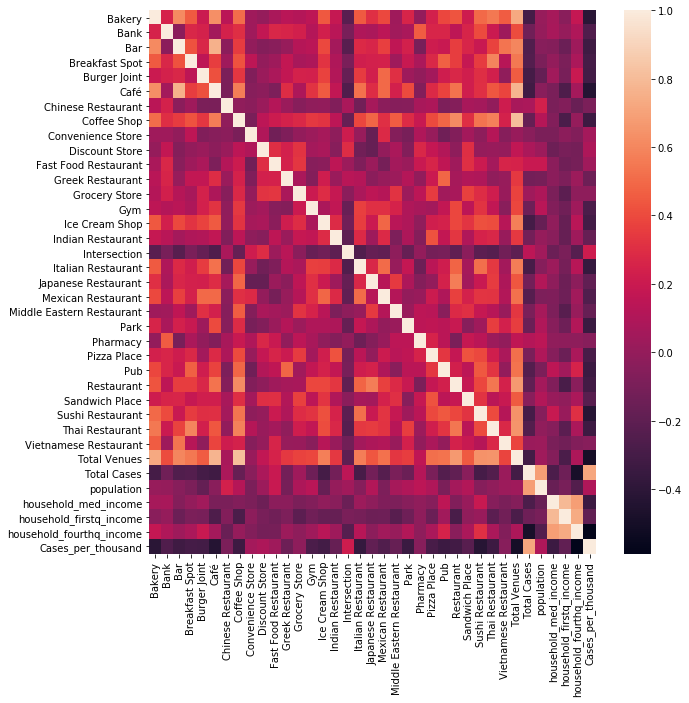

In [51]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cases_venues_hot10.corr())

In [52]:
# Let's define a function that can create new columns by dividing by the population in each neighbourhood.

def addNewPerThousand(df,colname):
    new_colname = colname+'_perthousand'
    df[new_colname] = df[colname]/(df['population']/1000.)
    
colnames = cases_venues_hot10.drop(columns=["Total Cases","Cases_per_thousand","population"]).columns.values
for col in colnames:
    addNewPerThousand(cases_venues_hot10,col)


In [53]:
#cases_venues_hot10.drop(colnames,axis=1,inplace=True)
cases_venues_hot10.corr()['Cases_per_thousand'].sort_values()

household_fourthq_income               -0.588745
Total Venues                           -0.501046
household_fourthq_income_perthousand   -0.498946
Café                                   -0.429447
Total Venues_perthousand               -0.426988
                                          ...   
population                              0.099996
Intersection_perthousand                0.191450
Intersection                            0.212121
Total Cases                             0.716635
Cases_per_thousand                      1.000000
Name: Cases_per_thousand, Length: 71, dtype: float64

Text(0, 0.5, 'cases per thousand')

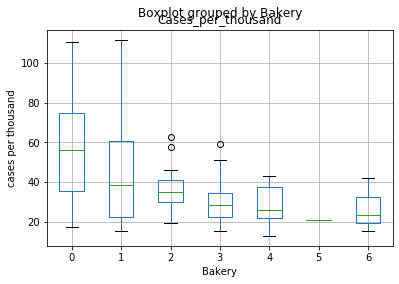

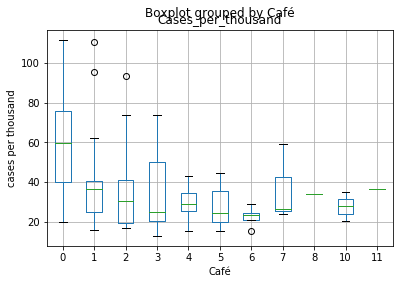

In [85]:
cases_venues_hot10.boxplot(by='Bakery',column='Cases_per_thousand')
plt.ylabel("cases per thousand")
cases_venues_hot10.boxplot(by='Café',column='Cases_per_thousand')
plt.ylabel("cases per thousand")


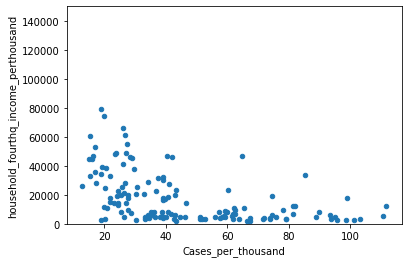

In [55]:
cases_venues_hot10.plot(kind='scatter',x="Cases_per_thousand",y="household_fourthq_income_perthousand")
plt.ylim(0,150000)
plt.show()

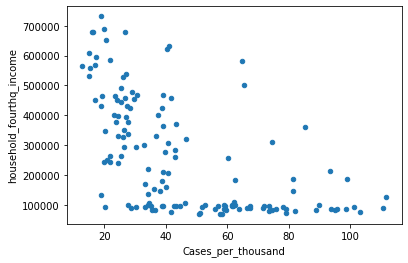

In [56]:
cases_venues_hot10.plot(kind='scatter',x="Cases_per_thousand",y="household_fourthq_income")

## Data exploration is done. Now we buil our Machine Learning Models.

### First we will create the train and test samples and then try many different regression models and calculate the performance based on the RMSE (root mean squared error).

In [126]:
X = cases_venues_hot10.drop(columns=["Total Cases","Cases_per_thousand"])
y = cases_venues_hot10['Cases_per_thousand']
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=40)

In [127]:
# Linear Regression  Model
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train,y_train)


LinearRegression()

In [128]:
y_hat = lr.predict(X_test)
from sklearn.metrics import mean_squared_error as mse
rmse = np.sqrt(mse(y_hat,y_test.values))
print("RMSE = ",rmse)

RMSE =  33.59935422137383


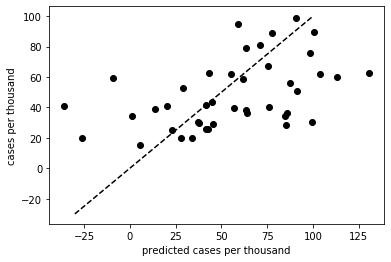

In [129]:
plt.plot(y_hat,y_test.values,'ok')
plt.xlabel("predicted cases per thousand")
plt.ylabel("cases per thousand")
plt.plot([-30,100],[-30,100],'--k')
plt.show()

### Let's apply cross validation to all models for a better determination of the performance

In [130]:
# Apply Cross-validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(lr,X_train,y_train,scoring="neg_mean_squared_error",cv=10)
lr_rmse_scores = np.sqrt(-scores)

In [131]:
def display_scores(scores):
    print("Scores:",scores)
    print("Mean",scores.mean())
    print("Std Dev:",scores.std())


In [132]:
display_scores(lr_rmse_scores)

Scores: [29.05768578 25.49246346 35.11123049 22.31693493 33.16048233 33.81756628
 22.87569419 65.60573505 31.42418553 36.16217611]
Mean 33.50241541354389
Std Dev: 11.690928755367302


In [133]:
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(degree=3,include_bias=False)
X_poly = poly_features.fit_transform(X_train)
scores = cross_val_score(lr,X_poly,y_train,scoring="neg_mean_squared_error",cv=10)
poly_rmse_scores = np.sqrt(-scores)
display_scores(poly_rmse_scores)

Scores: [100.95776047  39.40111851 174.5576963   20.66023456  25.17345337
  31.89947886  20.39731514  35.32386702  19.63996564  23.92611389]
Mean 49.193700378452114
Std Dev: 47.6605112546453


In [134]:
from sklearn.svm import LinearSVR
svm_reg = LinearSVR(epsilon=15.,C=6)
scores = cross_val_score(svm_reg,X_train,y_train,scoring="neg_mean_squared_error",cv=10)
svr_rmse_scores = np.sqrt(-scores)
display_scores(svr_rmse_scores)

Scores: [26.23445057 18.35389705 30.35853242 23.62486098 20.06144313 17.59479656
 21.88963385 13.32621404 15.43256572 17.18686228]
Mean 20.406325660859004
Std Dev: 4.929908194894589


In [135]:
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor()
scores = cross_val_score(tree_reg,X_train,y_train,scoring="neg_mean_squared_error",cv=10)
tree_rmse_scores = np.sqrt(-scores)
display_scores(tree_rmse_scores)

Scores: [22.28206679 21.74676089 16.22953143 35.3145524  24.49306995 17.88360057
 31.14975799 15.08713245 18.63636707 29.9091868 ]
Mean 23.27320263444953
Std Dev: 6.504183797201941


In [136]:
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor()
scores = cross_val_score(forest_reg,X_train,y_train,scoring="neg_mean_squared_error",cv=10)
forest_rmse_scores = np.sqrt(-scores)
display_scores(forest_rmse_scores)

Scores: [13.46295057 16.13309128 12.99389892 24.22913084 26.1640247  14.83130439
 15.31665081  8.63022593 20.25199492 22.7875408 ]
Mean 17.48008131757154
Std Dev: 5.337669140622916


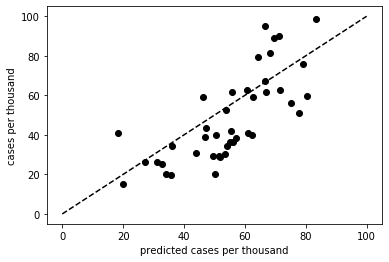

RMSE= 16.097476649444058


In [137]:
from sklearn.metrics import mean_squared_error
y_hat = forest_reg.fit(X_train,y_train).predict(X_test)
plt.plot(y_hat,y_test.values,'ok')
plt.xlabel("predicted cases per thousand")
plt.ylabel("cases per thousand")
plt.plot([-0,100],[-0,100],'--k')
plt.show()
print("RMSE=",np.sqrt(mean_squared_error(y_test,y_hat)))




In [138]:
# we will do a Grid Search for the best parameters in the Random Forest Regressor Model
from sklearn.model_selection import GridSearchCV
param_grid = [
    {'n_estimators':[5,10,15,20,25,30,50,100,150],'max_features':[0.2,0.4,0.6,0.8,1.0]}
]
grid_search = GridSearchCV(forest_reg,param_grid,cv=10,scoring='neg_mean_squared_error',return_train_score=True)
grid_search.fit(X_train,y_train)
grid_search.best_estimator_

RandomForestRegressor(max_features=1.0, n_estimators=25)

In [139]:
grid_search.best_params_

{'max_features': 1.0, 'n_estimators': 25}

In [140]:
cvres = grid_search.cv_results_
for mean_score,params in zip(cvres["mean_test_score"],cvres["params"]):
    print(np.sqrt(-mean_score),params)

19.7365608921958 {'max_features': 0.2, 'n_estimators': 5}
19.754471412543552 {'max_features': 0.2, 'n_estimators': 10}
19.207518842374526 {'max_features': 0.2, 'n_estimators': 15}
19.086476824498316 {'max_features': 0.2, 'n_estimators': 20}
18.89039627031204 {'max_features': 0.2, 'n_estimators': 25}
19.018735313202946 {'max_features': 0.2, 'n_estimators': 30}
17.617871499228734 {'max_features': 0.2, 'n_estimators': 50}
17.71889502167843 {'max_features': 0.2, 'n_estimators': 100}
18.134614375707777 {'max_features': 0.2, 'n_estimators': 150}
17.87511697045003 {'max_features': 0.4, 'n_estimators': 5}
18.489502414508422 {'max_features': 0.4, 'n_estimators': 10}
18.670946845981774 {'max_features': 0.4, 'n_estimators': 15}
18.779435281536088 {'max_features': 0.4, 'n_estimators': 20}
18.559151823323866 {'max_features': 0.4, 'n_estimators': 25}
18.01520449136633 {'max_features': 0.4, 'n_estimators': 30}
18.045614425816403 {'max_features': 0.4, 'n_estimators': 50}
18.186663005627384 {'max_featu

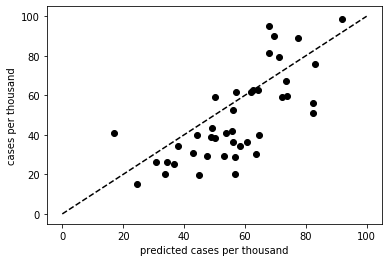

RMSE= 17.35203410204146


In [141]:
forest_reg = RandomForestRegressor(max_features= 1.0, n_estimators= 25)
y_hat = forest_reg.fit(X_train,y_train).predict(X_test)
plt.plot(y_hat,y_test.values,'ok')
plt.xlabel("predicted cases per thousand")
plt.ylabel("cases per thousand")
plt.plot([-0,100],[-0,100],'--k')
plt.show()
print("RMSE=",np.sqrt(mean_squared_error(y_test,y_hat)))

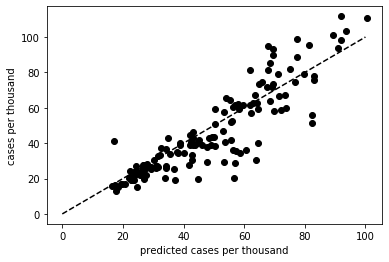

RMSE= 11.351104019459624


In [142]:
# Let's see the model predicted values in the full data set.
y_hat = forest_reg.predict(X)
plt.plot(y_hat,y.values,'ok')
plt.xlabel("predicted cases per thousand")
plt.ylabel("cases per thousand")
plt.plot([-0,100],[-0,100],'--k')
plt.show()
print("RMSE=",np.sqrt(mean_squared_error(y,y_hat)))


In [143]:
# Let's look at the importance of each feature in the Model
feature_importances = grid_search.best_estimator_.feature_importances_
features = cases_venues_hot10.drop(columns=["Total Cases","Cases_per_thousand"]).columns.values


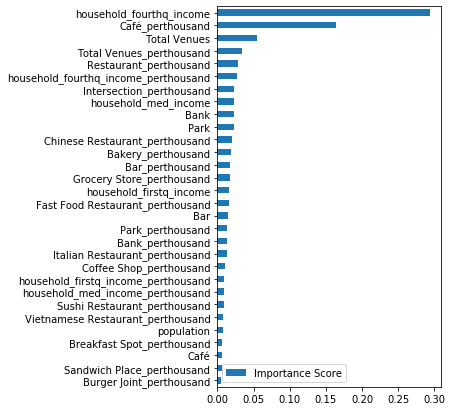

In [144]:
importance_df = pd.DataFrame({'Importance Score':list(feature_importances)},index=list(features))
importance_df.sort_values('Importance Score',ascending=True)[-30:].plot(kind='barh',figsize=(4,7))

## Now let's explore the spatial distribution of COVID19 cases and see if we can infer anything from the model and the data.

In [76]:
# We create a new dataframe that contains only the most relevant data and model features:  
# Cases per thousand, fourth quintile income and Total Venues.

df_totalcases = cases_venues_hot10[["Cases_per_thousand","household_fourthq_income","Total Venues"]]
#df_totalcases.reset_index(inplace=True)
df_totalcases["Neigh Number"] = np.char.zfill(df_neighnumber.values.astype(str),3)
df_totalcases

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Cases_per_thousand,household_fourthq_income,Total Venues,Neigh Number
Neighbourhood,,,,
Agincourt North,38.092948,146405.301563,17,129
Agincourt South-Malvern West,39.062171,97011.345679,29,128
Alderwood,29.533765,455262.552632,14,020
Annex,24.536461,397349.488118,50,095
Banbury-Don Mills,27.189023,394249.326944,16,042
...,...,...,...,...
Wychwood,32.963970,299072.068874,39,094
Yonge-Eglinton,19.378861,465639.092950,60,100
Yonge-St.Clair,16.922095,452580.736659,24,097


In [77]:
toronto_geo = r'toronto.json'

# create a numpy array of length 6 and has linear spacing from the minium to the maximum 
threshold_scale = np.linspace(df_totalcases['Cases_per_thousand'].min(),
                              df_totalcases['Cases_per_thousand'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum 

# let Folium determine the scale.
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto.choropleth(
    geo_data=toronto_geo,
    data=df_totalcases,
    columns=['Neigh Number', 'Cases_per_thousand'],
    key_on='feature.properties.AREA_S_CD',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID19 Cases per thousand hab.',
    reset=True
)
map_toronto

/usr/local/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [78]:
df_totalcases[['household_fourthq_income_2']] = df_totalcases[['household_fourthq_income']].values.clip(0,2000000)

# create a numpy array of length 6 and has linear spacing from the minium to the maximum 
threshold_scale = np.linspace(df_totalcases['household_fourthq_income_2'].min(),
                              df_totalcases['household_fourthq_income_2'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum 

# let Folium determine the scale.
map_toronto2 = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto2.choropleth(
    geo_data=toronto_geo,
    data=df_totalcases,
    columns=['Neigh Number', 'household_fourthq_income_2'],
    key_on='feature.properties.AREA_S_CD',
    #threshold_scale=threshold_scale,
    fill_color='YlOrRd_r', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Fourth Quintile Income (CA$)',
    reset=True
)
map_toronto2

/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:659: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[k] = np.nan
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

In [79]:
from IPython.core.display import display, HTML

htmlmap = HTML('<iframe srcdoc="{}" style="float:left; width: {}px; height: {}px; display:inline-block; width: 45%; margin: 0 auto; border: 2px solid black"></iframe>'
           '<iframe srcdoc="{}" style="float:right; width: {}px; height: {}px; display:inline-block; width: 45%; margin: 0 auto; border: 2px solid black"></iframe>'
           .format(map_toronto.get_root().render().replace('"', '&quot;'),500,500,
                   map_toronto2.get_root().render().replace('"', '&quot;'),500,500))
display(htmlmap)

/usr/local/lib/python3.7/site-packages/IPython/core/display.py:717: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [80]:
# create a numpy array of length 6 and has linear spacing from the minium to the maximum 
threshold_scale = np.linspace(df_totalcases['Total Venues'].min(),
                              df_totalcases['Total Venues'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum 

# let Folium determine the scale.
map_toronto2 = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto2.choropleth(
    geo_data=toronto_geo,
    data=df_totalcases,
    columns=['Neigh Number', 'Total Venues'],
    key_on='feature.properties.AREA_S_CD',
    #threshold_scale=threshold_scale,
    fill_color='YlOrRd_r', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Venues',
    reset=True
)
htmlmap = HTML('<iframe srcdoc="{}" style="float:left; width: {}px; height: {}px; display:inline-block; width: 45%; margin: 0 auto; border: 2px solid black"></iframe>'
           '<iframe srcdoc="{}" style="float:right; width: {}px; height: {}px; display:inline-block; width: 45%; margin: 0 auto; border: 2px solid black"></iframe>'
           .format(map_toronto.get_root().render().replace('"', '&quot;'),500,500,
                   map_toronto2.get_root().render().replace('"', '&quot;'),500,500))
display(htmlmap)
#map_toronto2